# Sprawozdanie 1
Analiza i przetwarzanie obrazów <br>
Tomasz Maczek, grupa 3 (piątek 10:30), 2022/2023, WFiIS

In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams['font.size'] = 16

# Laboratorium 2

**a) Proszę wczytać przykładowy obraz.**

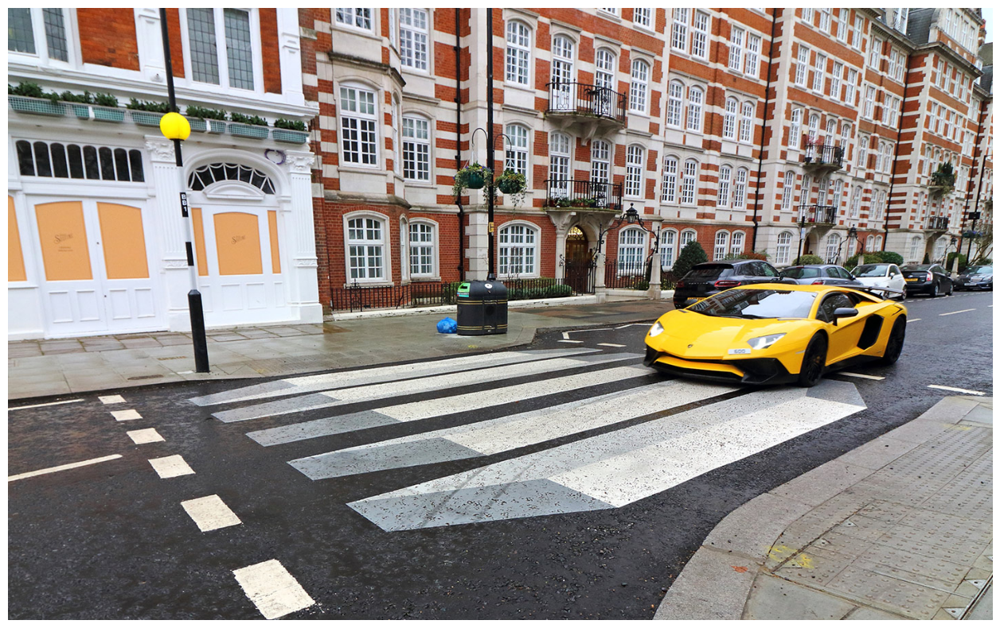

In [2]:
image = cv2.imread("lab2.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

plt.imshow(image)
plt.axis('off')

plt.show()

**b) Dokonaj konwersji obrazu do skali szarości. Dlaczego wynikowy obraz nie jest tworzony
po prostu przez dodanie składowych R+G+B z wagą 1?**

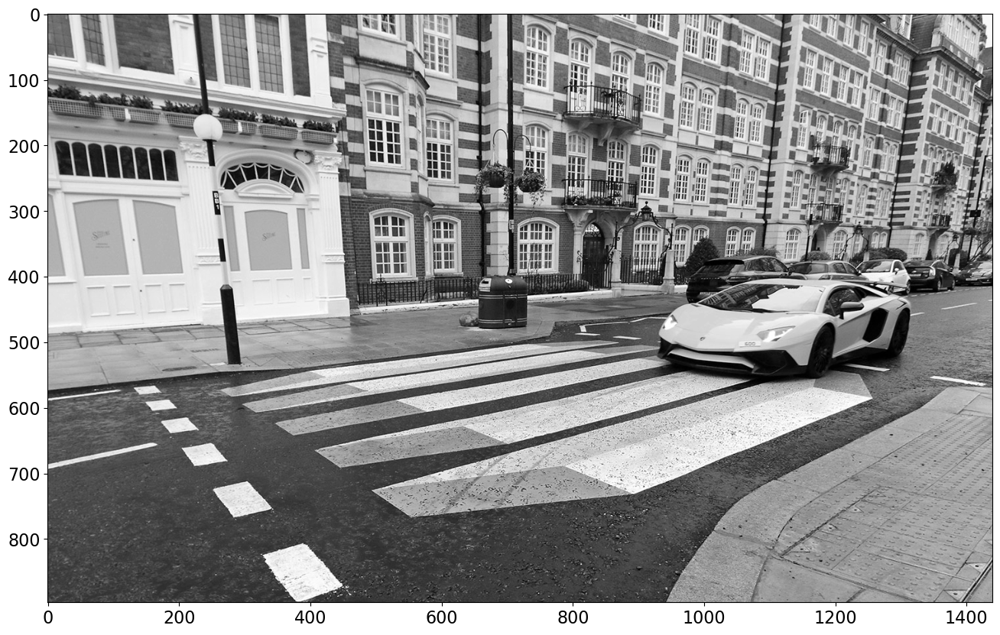

In [3]:
grayscale = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

plt.imshow(grayscale, cmap='gray')
plt.show()

Dla przetestowania sprawdziłem wartości zwrócowe przez konwersję do skali szarości przez cv2 i porównałem z uśrednioną wartością kanałów RBG dla wybranego piksela - jest on na masce żółtego samochodu.

In [4]:
x = 450 #wspolrzedne piksela -> maska samochodu
y = 1000

(R, G, B) = image[x, y]

(GS) = grayscale[x, y]

print("Wartości piksela w obrazie: " +  str(R) + ", " + str(G) + ", " +  str(B))
print("Uśredniona wartość: " + str (int((int(R) + int(G) + int(B)) / 3))) 
print("Wartość po użyciu RGB2GRAY: " + str(GS))

Wartości piksela w obrazie: 254, 219, 53
Uśredniona wartość: 175
Wartość po użyciu RGB2GRAY: 211


Wzór, z którego korzysta cv2 do przekonwertowania na skalę szarości to $Y = 0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B$. <br>
Jest to metoda *luminosity*, która uśrednia wartości RGB z wagami odzwierciedlającymi jak wrażliwe jest ludzkie oko na dane barwy. Ponieważ jesteśmy bardziej wrażliwi na zielenie niż kolory niebieskie, G ma większą wagę niż B. <br>
Poniżej porównanie obrazu otrzymanego obiema metodami konwersji do skali szarości.

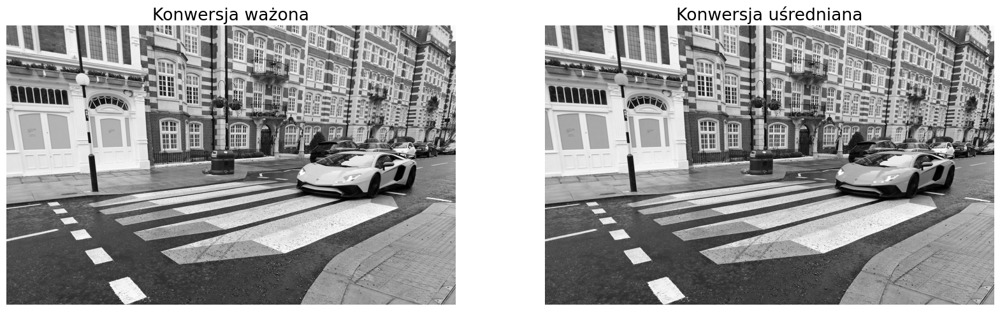

In [5]:
grayscale_avg = grayscale.copy()

h = grayscale.shape[0]
w = grayscale.shape[1]

for y in range(w):
    for x in range(h):
        r, g, b = image[x, y]
        grayscale_avg[x, y] = (int(r) + int(g) + int(b)) / 3.0 
        

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(grayscale, cmap='gray')
ax1.set_title("Konwersja ważona")
ax1.axis('off')
ax2.imshow(grayscale_avg, cmap='gray')
ax2.set_title("Konwersja uśredniana")
ax2.axis('off')

plt.show()

Jak można zauważyć na rysunku powyżej, dla konwersji ważonej samochód jest jaśniejszy niż dla uśrednienia. Ponieważ dla koloru żółtego w reprezentacji RGB wartość B jest niska, zaniża ona średnią przez co w skali szarości samochód jest ciemniejszy, bliższy koloru chodnika niż pasów. <br>
<br>
W konwersji ważonej lepiej odzwierciedlony jest kontrast - przez co samochód tam ma odcień bliższy pasów bądź budynku z lewej.

**c) Proszę rozdzielić składowe RGB obrazu i wyświetlić trzy obrazy w skali szarości
odpowiadające intensywności pierwotnego obrazu osobno w składowych R, G i B.**

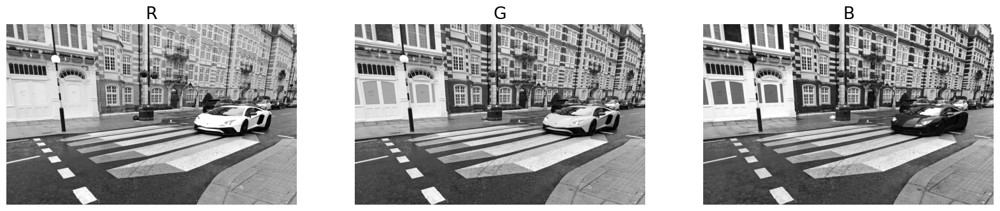

In [6]:
r, g, b = cv2.split(image)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

ax1.imshow(r, cmap='gray')
ax1.axis('off')
ax1.set_title('R')

ax2.imshow(g, cmap='gray')
ax2.axis('off')
ax2.set_title('G')

ax3.imshow(b, cmap='gray')
ax3.axis('off')
ax3.set_title('B')

plt.show()

'Czysty' kolor żółty w palecie RBG ma wartości (255, 255, 0). Kolor testowego piksela z maski samochodu ma wartości (254, 219, 53) - kanał niebieski nie jest zerowy, ale wciąż ma niską wartość. Obserwujemy więc dla skali szarości odpowiadającej intensywności koloru niebieskiego w oryginalnym obrazie bardzo ciemny samochód. <br>

Obserwujemy też wtopienie się okien w ścianę budynku po lewej w kanale R, gdzie ich kolor ma bardzo niską wartość czerwieni.

**d) Dokonaj konwersji obrazu do skali HSV i wyświetl trzy obrazy w skali szarości
odpowiadające intensywności pierwotnego obrazu osobno w składowych H, S i V.**

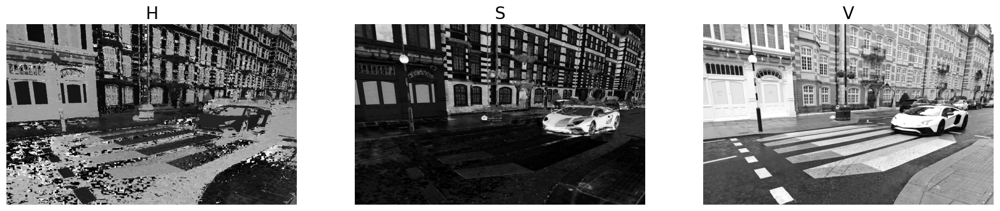

In [7]:
imageHSV = cv2.cvtColor(image,cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(imageHSV)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

ax1.imshow(h, cmap='gray')
ax1.axis('off')
ax1.set_title('H')

ax2.imshow(s, cmap='gray')
ax2.axis('off')
ax2.set_title('S')

ax3.imshow(v, cmap='gray')
ax3.axis('off')
ax3.set_title('V')
plt.show()

W modelu HSV składowe opisu barwy są następujące:
- H - Hue (odcień) 
- S - Saturation (nasycenie)
- V - Value - opisuje moc światła białego

Odcień jest reprezentowany przez kąt (0-360 stopni) na kole barw. Nasycenie i moc mają wartości od 0 do 1 (0% - 100%). Co warto zaznaczyć: w bibliotece cv2 odpowiednie wartości są reprezentowane następująco:
- H : 0-179 (360/2 wartości, tracimy nieco na dokładności)
- S : 0-255 (gdzie 255 odpowiada 100% lub 1)
- V : 0-255 (jak wyżej)


**e) Stwórz obraz na którym widoczny będzie jedynie żółty samochód /to cenne ćwiczenie w
zagadnieniach śledzenia obiektów/. Realizujemy to w skali HSV- dlaczego?**

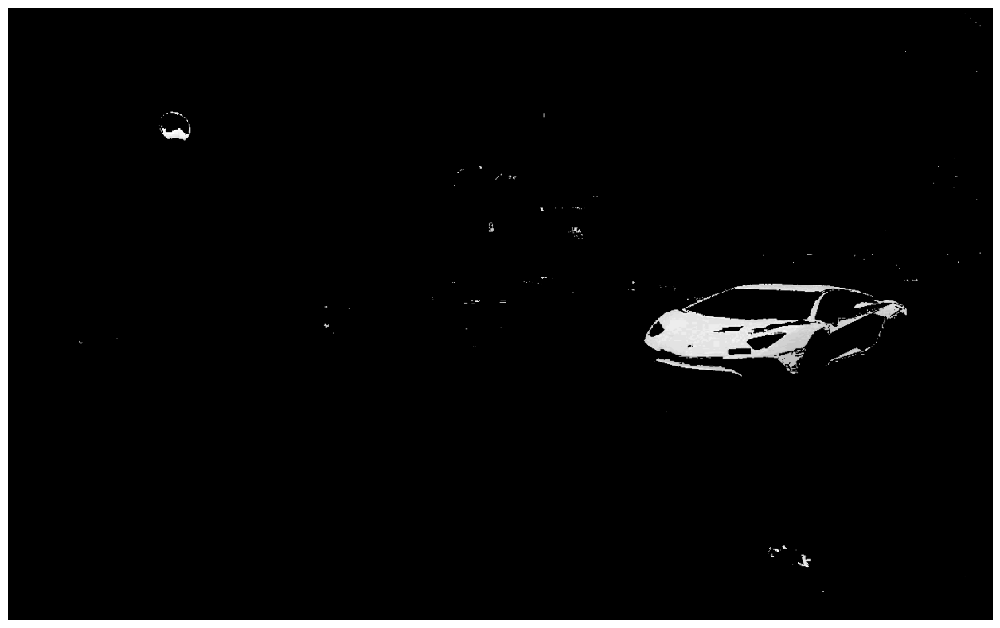

In [8]:
mask = cv2.inRange(imageHSV, (21, 101, 101), (28, 255, 255))

yellow = h.copy()

cv2.bitwise_and(h, mask, dst=yellow)
plt.imshow(yellow, cmap='gray')
plt.axis('off')

plt.show()

Model HSV jest mniej wrażliwy na zmiany oświetlenia na zdjęciu. Dla obrazu w RGB wartości dwóch odcieni żółtego na masce samochodu (w cieniu i odbijającego światło) mogą mieć znacznie różne wartości. W modelu HSV widzimy na rysunku dla podpunktu d) dla kanału H cała maska samochodu ma tam jednolity odcień szarości. Różnicę światła padającego na maskę widzimy na kanale S. <br>

Dla problemów detekcji obiektów ważne jest, aby algorytm działał niezależnie od zmian oświetlenia otoczenia. Gdybyśmy mieli takie samo zdjęcie zrobione wieczorem, wartości RGB koloru samochodu byłyby znowu inne, podczas gdy wartość odcienia pozostanie zbliżona.

**f) Proszę narysować histogram obrazu dla trzech składowych R,G,B**

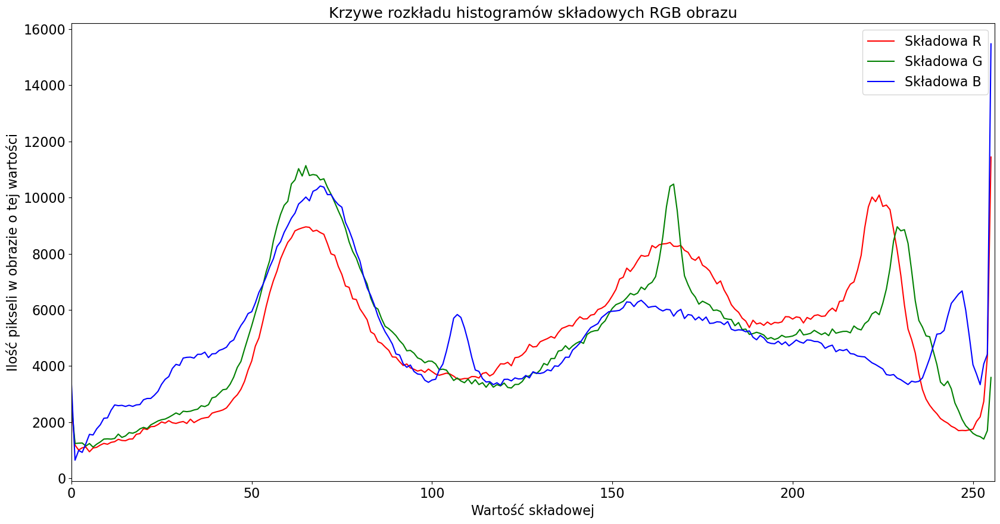

In [9]:
r_hist = cv2.calcHist([image], [0], mask=None, histSize =[256], ranges=[0, 256])
g_hist = cv2.calcHist([image], [1], mask=None, histSize =[256], ranges=[0, 256])
b_hist = cv2.calcHist([image], [2], mask=None, histSize =[256], ranges=[0, 256])

plt.plot(r_hist, color='r', label='Składowa R')
plt.plot(g_hist, color='g', label='Składowa G')
plt.plot(b_hist, color='b', label='Składowa B')
plt.xlabel('Wartość składowej')
plt.ylabel('Ilość pikseli w obrazie o tej wartości')
plt.legend(fontsize=16)
plt.title("Krzywe rozkładu histogramów składowych RGB obrazu", fontsize=18)
plt.xlim([0, 256])

plt.show()

**g) Proszę zrealizować rozciąganie kontrastu i wyrównanie histogramu – dla obrazu
zapisanego w skali szarości. Czym różni się wynik tych dwóch operacji?**

In [10]:
#funkcja wykonuje rozciąganie kontrastu dla przekazanego obrazu image w skali szarosci
#zwraca obraz o rozciagnietym kontrascie
def histogram_streching(image):
    streched_hist = image.copy()

    min_str = np.array(streched_hist).min()
    max_str = np.array(streched_hist).max()

    h = streched_hist.shape[0]
    w = streched_hist.shape[1]

    for y in range(w):
        for x in range(h):
            streched_hist[x, y] =((streched_hist[x, y] - min_str) / (max_str - min_str) )*255
            
    return streched_hist

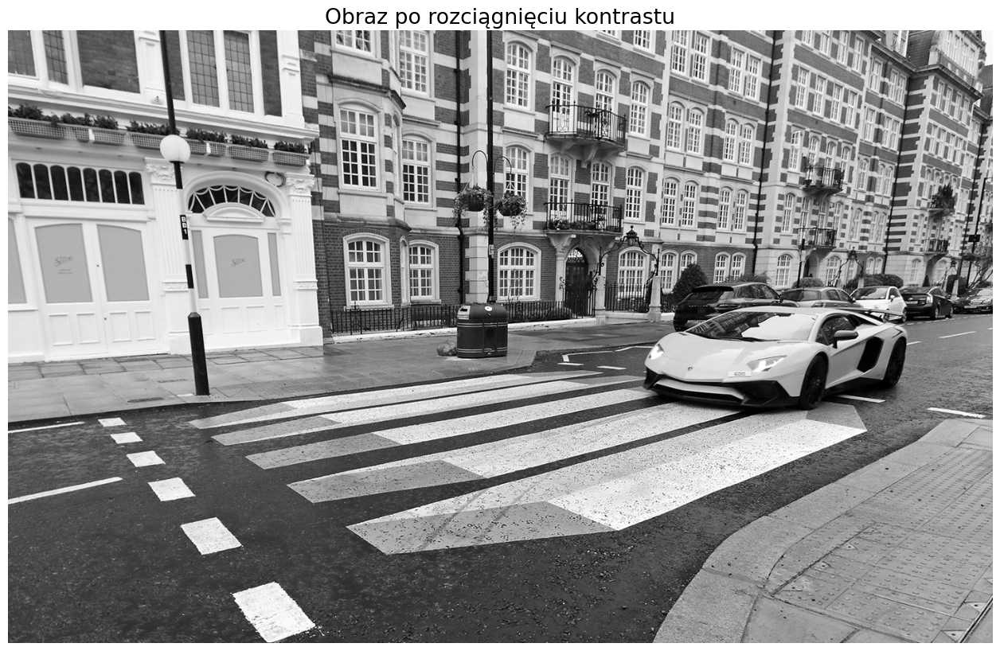

In [11]:
#rozciaganie kontrastu

streched_hist = histogram_streching(grayscale)

plt.imshow(streched_hist, cmap='gray')
plt.axis('off')
plt.title('Obraz po rozciągnięciu kontrastu')
plt.show()

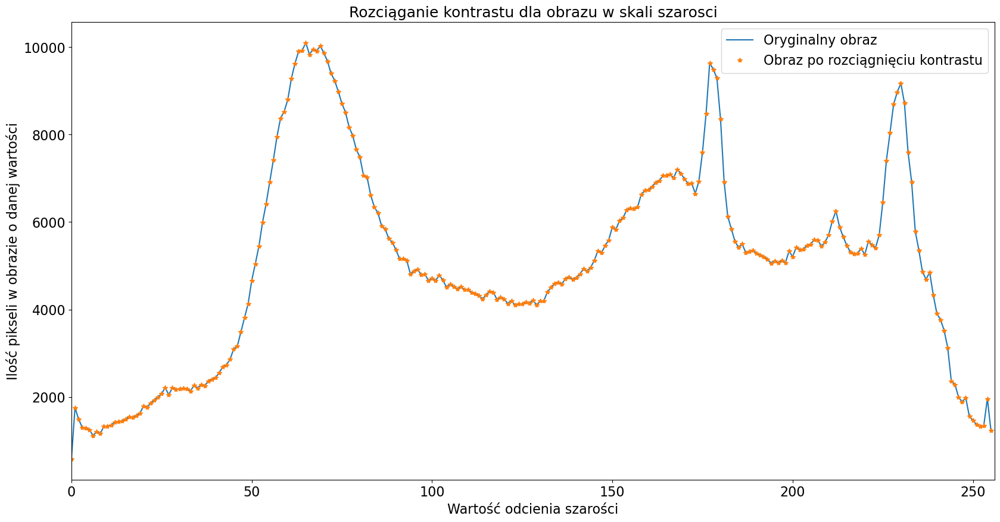

In [12]:
hist_str = cv2.calcHist([streched_hist], [0], mask=None, histSize =[256], ranges=[0, 256])
hist_original = cv2.calcHist([grayscale], [0], mask=None, histSize =[256], ranges=[0, 256])


plt.plot(hist_original, label='Oryginalny obraz')
plt.plot(hist_str, '*', label='Obraz po rozciągnięciu kontrastu')

# plt.hist(streched_hist.flatten(),256,[0,256])
# plt.hist(grayscale.flatten(), 256, [0, 256])

plt.xlim([0, 256])
plt.legend(fontsize=16)
plt.title('Rozciąganie kontrastu dla obrazu w skali szarosci', fontsize=18)
plt.xlabel('Wartość odcienia szarości')
plt.ylabel('Ilość pikseli w obrazie o danej wartości')
plt.show()

Rozciągnięcie kontrastu stosuje się by poprawić jakość obrazu. Przy jego użyciu kształt histogramu zostaje taki sam, jednak zostanie on rozciągnięty tak, aby wypełnić całą przestrzeń wartości kolorów. <br>
Na powyższym wykresie przestawiono krzywą histogramu oryginalnego szarego obrazu i zaznaczono punktami wartości kolorów (lepiej widoczne niż gdyby narysować 2 histogramy na sobie). Dla tego obrazu rozciąganie kontrastu nie zmieniło nic, ponieważ odcienie szarości zajmowały cały przedział [0, 255]. Zmiany zauważylibyśmy, gdyby na obrazie nie było kolorów bardzo ciemnych lub bardzo jasnych, wtedy rozciągnięcie miało by większy sens. Najciemniejszy odcień zostałyby rozcięty do wartości 0 a najjaśniejszy do 255.

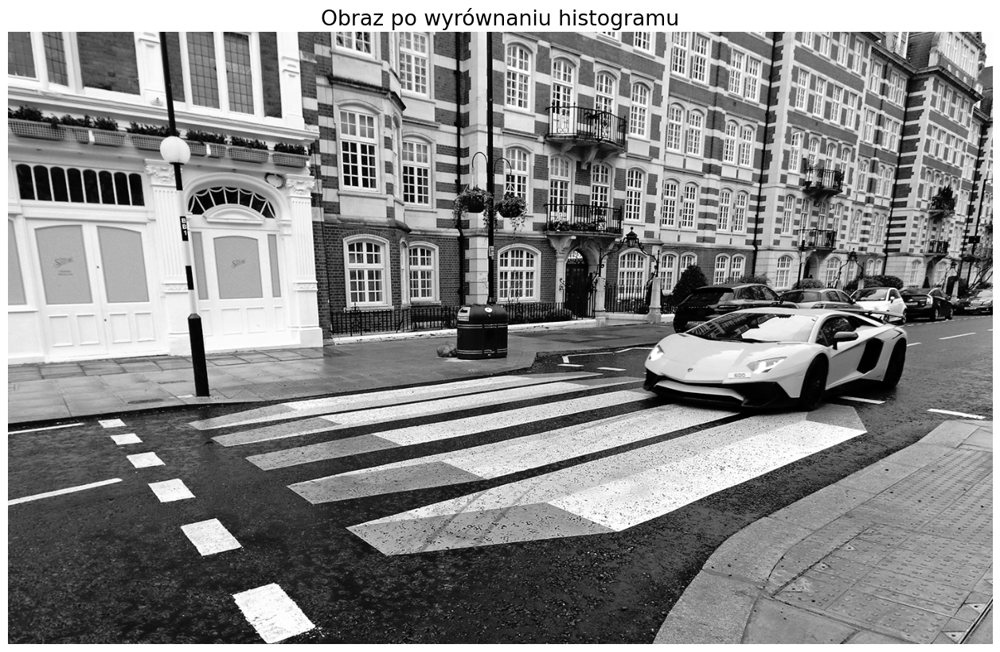

In [13]:
# wyrównanie histogramu
equ = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))

plt.imshow(equ, cmap='gray')
plt.axis('off')
plt.title('Obraz po wyrównaniu histogramu')

plt.show()

Ilość pikseli w całym obrazie: 1291680
Średnia ilość piksel/odcień szarości: 5045.625


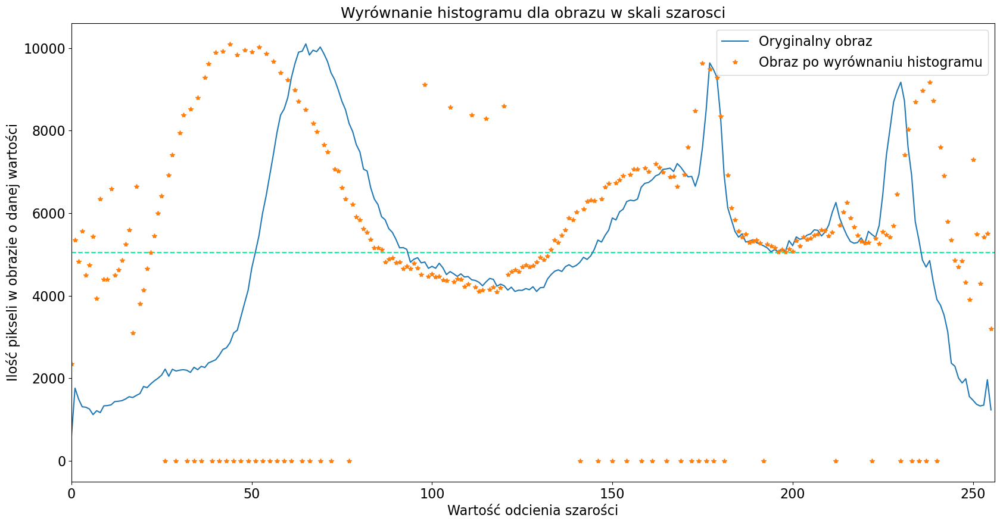

In [14]:
hist_equ = cv2.calcHist([equ], [0], mask=None, histSize =[256], ranges=[0, 256])

pix = image.shape[0] * image.shape[1]
avg_pix = pix/256

print('Ilość pikseli w całym obrazie: ' + str(pix))
print("Średnia ilość piksel/odcień szarości: " + str(avg_pix))

plt.axhline(avg_pix, color='mediumspringgreen', linestyle='--')

# plt.hist(equ.flatten(),256,[0,256])
# plt.hist(grayscale.flatten(), 256, [0, 256])

plt.plot(hist_original, label='Oryginalny obraz')
plt.plot(hist_equ, '*', label='Obraz po wyrównaniu histogramu')

plt.xlim([0, 256])
plt.legend(fontsize=16)
plt.xlabel("Wartość odcienia szarości")
plt.ylabel('Ilość pikseli w obrazie o danej wartości')
plt.title('Wyrównanie histogramu dla obrazu w skali szarosci', fontsize=18)
plt.show()

Przy użyciu wyrównania histogramu nie chcemy już zachować kształtu oryginalnego histogramu, lecz chcemy go jak najbardziej spłaszczyć (inaczej: chcemy by dystrybuanta histogramu była jak najbliższa funkcji liniowej). W przeciwieństwie do rozciągania histogramu, ta metoda może przynieść efekty gdy oryginalny histogram już wypełnia cały przedział [0, 255] wartości odcienia. <br>
Uproszczony algorytm działania tej metody:
<ol>
    <li>Dla oryginalnego obrazu mamy histogram - zliczona ilość pikseli dla wartości szarości 0-255</li>
    <li>Sumujemy dla <b>n</b> = [0,  ..., 255] ilość pikseli dotąd, tj. które mają wartość odcienia mniejszą lub równą n</li>
    <li>Dzielimy tą sumę przez całkowitą ilość pikseli w obrazie i zaokrąglamy do wartości całkowitej <b>m</b>.</li>
    <li>Piksel, który w oryginalnym obrazie miał odcień o wartośći <b>n</b> będzie miał w obrazie po konwersji odcień o odpowiadającej temu <b>n</b> policzonej wartości <b>m</b>.</li>
</ol>

Poniżej została przedstawiona tabelka, w której ten proces został pokazany dla początkowych n dla rozważanego obrazu.

(Źródło algorytmu/podobnej tabeli: <a href="https://www.uobabylon.edu.iq/eprints/paper_5_10128_257.pdf">SRC</a>)

<table>
<thead>
  <tr>
     <th>Poziom szarości <b>n</b></th>
    <th>0</th>
    <th>1</th>
    <th>2</th>
    <th>3</th>
    <th>4</th>
    <th>5</th>
    <th>6</th>
    <th>7</th>
    <th>8</th>
    <th>9</th>
    <th>10</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td>Ilość pikseli</td>
    <td>588</td>
    <td>1759</td>
    <td>1492</td>
    <td>1306</td>
    <td>1297</td>
    <td>1253</td>
    <td>1117</td>
    <td>1212</td>
    <td>1166</td>
    <td>1330</td>
    <td>1336</td>
  </tr>
  <tr>
    <td>Suma pikseli dotąd</td>
    <td>588</td>
    <td>2347</td>
    <td>3839</td>
    <td>5145</td>
    <td>6642</td>
    <td>7695</td>
    <td>8812</td>
    <td>10 024</td>
    <td>11 190</td>
    <td>12 520</td>
    <td>13 856</td>
  </tr>
  <tr>
    <td>Suma dotąd / ilość pikseli w obrazie</td>
    <td>0.11</td>
    <td>0.47</td>
    <td>0.76</td>
    <td>1.02</td>
    <td>1.28</td>
    <td>1.52</td>
    <td>1.75</td>
    <td>1.99</td>
    <td>2.22</td>
    <td>2.48</td>
    <td>2.75</td>
  </tr>
  <tr>
      <td>Poziom szarości po wyrównaniu <b>m</b></td>
    <td>0</td>
    <td>0</td>
    <td>1</td>
    <td>1</td>
    <td>1</td>
    <td>1</td>
    <td>2</td>
    <td>2</td>
    <td>2</td>
    <td>2</td>
    <td>3</td>
  </tr>
</tbody>
</table>

Widzimy, że piksele o wartościach 0 i 1 zostały razem 'zgrupowane' do wartości 0, piksele o wartościach od 2 do 5 do wartości 1 i tak dalej. Można by opisać działanie tego algorytmu następująco: w nowym obrazie ilość pikseli o każdym odcieniu powinna być jak najbardziej zbliżona (jak najbardziej bliska liczbie sumy pikseli / ilość wartości w skali koloru - u nas 256). <br>

Wyrównanie histogramu jednak nie przyniesie dokładnie takich efektów. Na wykresie wyżej do tego przykładu obserwujemy po wyrównaniu, że dla niektórych wartości odcieni mamy po 0 pikseli. Wynika to z działania tego algorytmu - jeśli ilość pikseli o danym odcieniu n będzie większa niż średnia ilość pikseli na kolor, jest szansa że 'przeskoczymy' pewną wartość i zaokrąglenie nastąpi do wartości o 1 większej. <br>

Na wspomnianym wykresie cienką zieloną linią zaznaczona jest ta wartość średnia dla rozważanego obrazu. Ponad nią dla oryginalnego obrazu obserwujemy 3 piki krzywej histogramu - odpowiadają im 3 grupy zer histogramu wyrównanego. Fakt, że szczególnie dla pierwszego piku i pierwszej grupy zer nie mamy dokładnie odpowiadającego przedziału na osi x wynika z działania tej metody -  kilka wartości odcienia oryginału zostało zgrupowane do jednej wartości po wyrównaniu(widzimy w tabeli - 10 wartości od 0 do 9 oryginału zostało odwzorowanych w 3 wartościach), przez co pierwszy pik krzywej po wyrównaniu jest przesunięty w lewą stronę (podobnie ostatni pik jest przesunięty lekko w prawo).

Poniżej porównanie działania obu metod. Widzimy że rozciąganie kontrastu dla tego obrazu nie dało zmiany. Wyrównanie histogramu natomiast wyostrzyło kontrast - obiekty które były ciemne są jeszcze ciemniejsze.

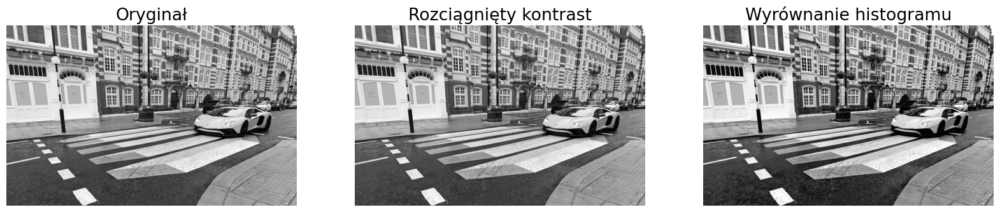

In [15]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

ax1.imshow(grayscale, cmap='gray')
ax1.set_title('Oryginał')
ax1.axis('off')


ax2.imshow(streched_hist, cmap='gray')
ax2.set_title('Rozciągnięty kontrast')
ax2.axis('off')

ax3.imshow(equ, cmap='gray')
ax3.set_title('Wyrównanie histogramu')
ax3.axis('off')

plt.show()